<a href="https://colab.research.google.com/github/ashikshafi08/Learning-Fastai/blob/main/Part_2/Stable_Diffusion_09.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Trying out the Diffusers library from HuggingFace. 

Below are the imports we will be needing, 

In [ ]:
# Run for the first time
!pip install -q --upgrade transformers diffusers ftfy


In [ ]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
# Constructing a Stable Diffusion Pipeline using diffusers 
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [ ]:
# Prompt 
prompt = "photograph of big smoke from gta playing soccer"

  0%|          | 0/50 [00:00<?, ?it/s]

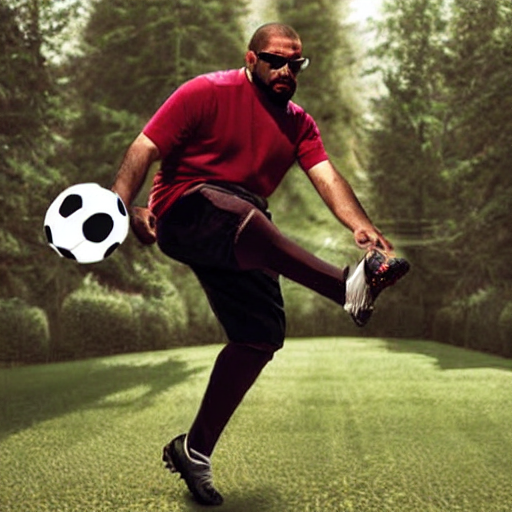

In [ ]:
pipe(prompt).images[0]

In the above we have a progress bar with 50 steps, what does it do? 

So at first we start with a random noise and as the steps goes it tries to reduce the noise further. 

In a nutshell, this is how the difussion model works where it starts from a rnadom noise at top to professively improved images towards the bottom. 

What about doing it in one go? Why 50 steps? 

If we're to run this in one go the model won't be performing well. 

Lets try one for 3 steps. 

  0%|          | 0/3 [00:00<?, ?it/s]

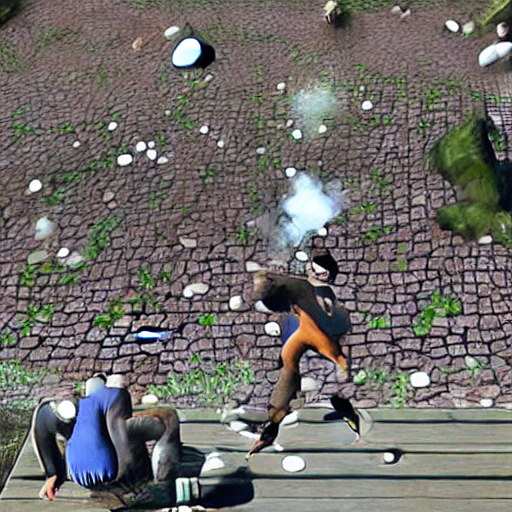

In [ ]:
pipe(prompt , num_inference_steps = 3).images[0]

### Classifier - Free Guidance 

Its a method to increase the adherence of the output to the conditioning signal we use (the prompt). 

The larger the guidance the more the model tries its best to represent the given prompt, the default is 7.5 which is a great balance btw variety and fidelity. 

However, large values tend to produce less diversity. 

For more: https://sander.ai/2022/05/26/guidance.html

In [ ]:
# Creating a function that will draw a imagre grid 

def image_grid(imgs, rows , cols):
  w , h = imgs[0].size
  grid = Image.new("RGB" , size = (cols*w, rows*h))
  for i , img in enumerate(imgs): grid.paste(img, box = (i%cols*w , i //cols*h))
  return grid 

In [ ]:
# Creating number of rows and cols 
num_rows , num_cols = 4, 4
prompts = [prompt] * num_cols

In [ ]:
# Creating different versions of the output with different guidance 

images = concat(pipe(prompts , guidance_scale = g).images for g in [1.1 , 3 ,7 , 14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

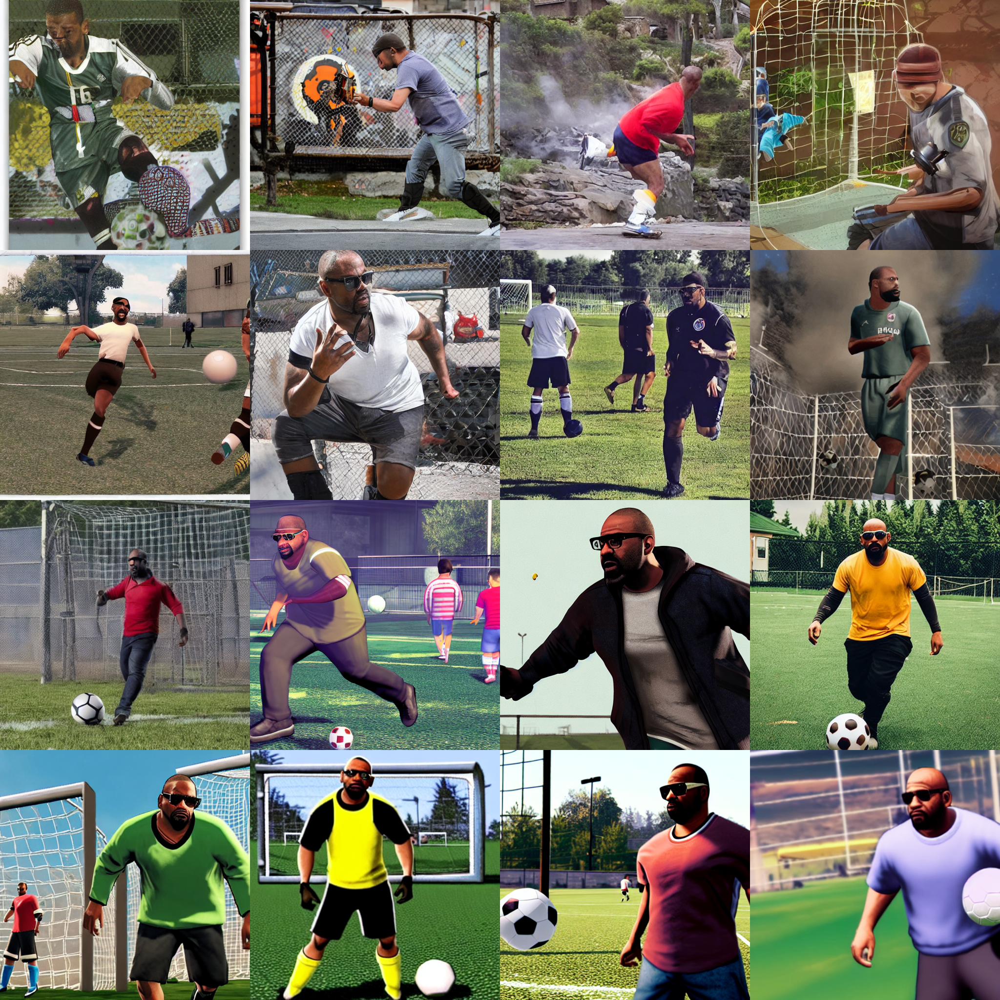

In [ ]:
# Using the above in the grid 
image_grid(images , rows = num_rows , cols = num_cols)

### Negative Prompts  

It refers to the use of another prompt, scaling the difference betwen generations of that prompt ad the conditioned generation. 

The basic idea is it will take the first prompt, and take a second image with a negative prompt and subtract from it. 





  0%|          | 0/50 [00:00<?, ?it/s]

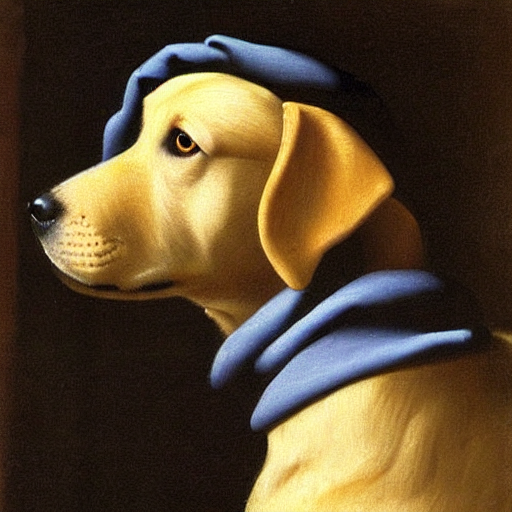

In [ ]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

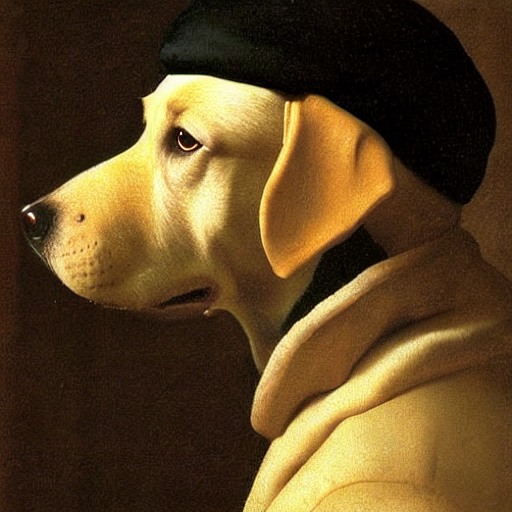

In [ ]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt='blue').images[0] # takes out the blue in the above

### Image 2 Image 

Here we present a basic image as a input and a prompt, the diffusion rather starting with a random noise instead it starts from a image with noise and develops from it. 

**Note:** It does follow the composition of the initial image.

We use a different pipeline for it. 

In [ ]:
# Image 2 Image 
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [ ]:
# Constructing the pipeline 
model_id = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained( model_id , 
                                                      revision = "fp16",
                                                      torch_dtype = torch.float16 ).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading the example sketch. 

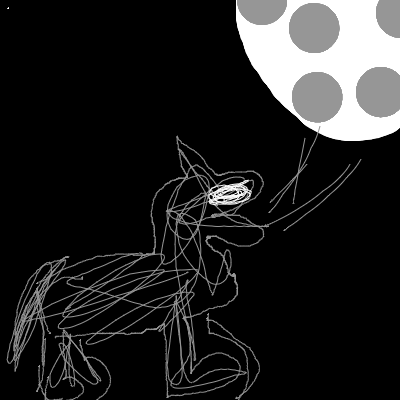

In [ ]:
p = FastDownload().download("https://s3.amazonaws.com/moonup/production/uploads/1664665907257-noauth.png")

# Initial image 
initialImage = Image.open(p).convert("RGB")
initialImage

/usr/local/lib/python3.9/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:545: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/40 [00:00<?, ?it/s]

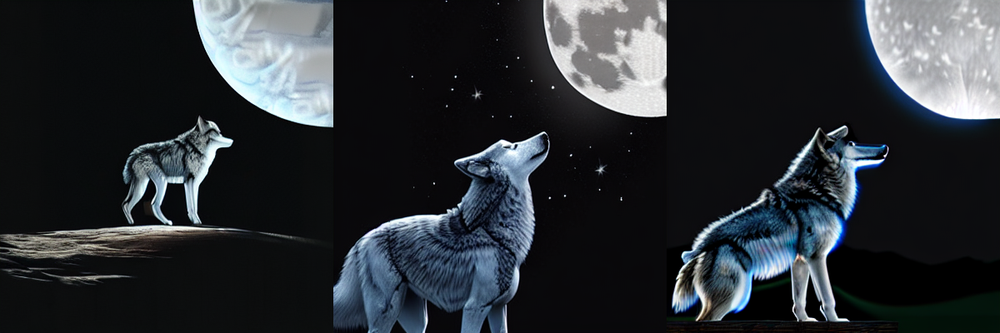

In [ ]:
# Using the above as the diffuser input
prompt = "Wolf howling at the moon, photorealistic 4K"

images = pipe(prompt = prompt , num_images_per_prompt = 3 , image = initialImage , strength = 0.8, 
              num_inference_steps = 50).images 
image_grid(images , rows = 1, cols = 3)          

`strength`: to what degree we want to create something or represent that looks like the `initialImage`. 

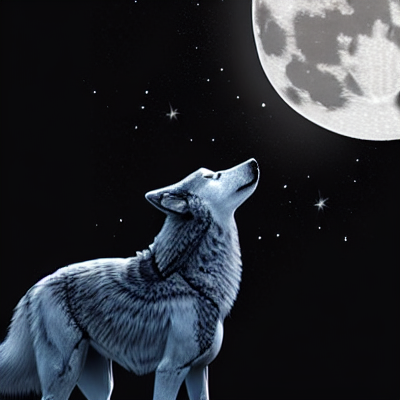

In [ ]:
# Using the above as the initial image or the basic composition and generate next 

initialImage = images[1]
initialImage

  0%|          | 0/56 [00:00<?, ?it/s]

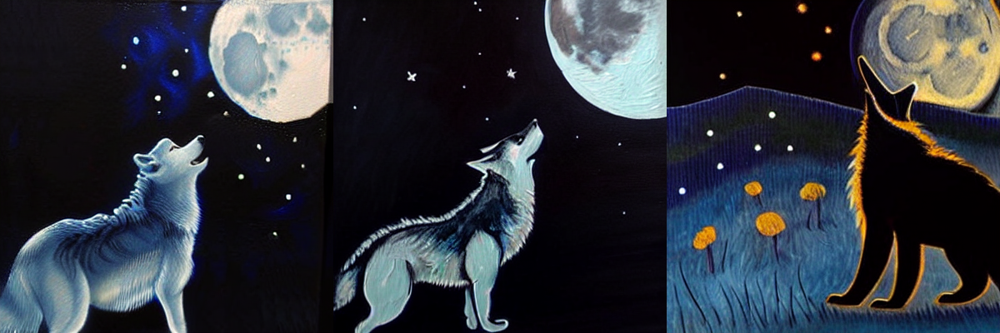

In [ ]:
# Using the above as the diffuser input
prompt = "Oil painting of wolf howling at the moon by Vang Gogh"

images = pipe(prompt = prompt , num_images_per_prompt = 3 , image = initialImage , strength = 0.8, 
              num_inference_steps = 70).images 
image_grid(images , rows = 1, cols = 3)          

## Fine Tuning 

Fine tuning can take quite a bit of time and quite a bit of data. So we can do something special kind of fine tuning is Textual Inversion. 

### Textual Inversion


Textual Inversion is a process where you can quickly "teach" a new word to the text model and plain its embedding close to some visual representation. 

This is achieved by adding a new token to the vocabulary, freezing the weights of all the model (except the encoder) and train with few representation images. 

https://textual-inversion.github.io/


Summary: Fine tune a single embedding, so take one embedding from hub and fine tune our model with it. Just one embedding so it will be much faster. 






In [ ]:
# Getting the embedding 

embedUrl = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embedPath = FastDownload().download(embedUrl)

# Creating a dictionary 
embedDict = torch.load(str(embedPath) , map_location = "cpu")

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16) 
pipe = pipe.to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

In [ ]:
print(f" Embedding :{next(iter(embedDict.keys()))} \n")
print(f"Sample values of the embedding: {list(embedDict.values())[0][:20]}")

 Embedding :<watercolor-portrait> 

Sample values of the embedding: tensor([-0.7581,  0.9135,  0.3285,  0.1872,  1.1011, -1.1042,  0.6732, -0.8179,
         1.7773, -0.7086,  0.4755,  0.1237,  0.5696,  1.2419, -0.8427, -0.1935,
         0.8221, -1.1030,  0.1608, -1.5768])


`embedDict` -> small Pytorch pickled dictionary, whose key is the new token that was trained. 

In [ ]:
# Appending things into the pipeline 
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder

# Getting the new token into the play 
new_token, embeds = next(iter(embedDict.items()))

**Adding the new token to the tokenizer and the trained embedding to the embedding table**

In [ ]:
assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

In [ ]:
text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)

text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

  0%|          | 0/50 [00:00<?, ?it/s]

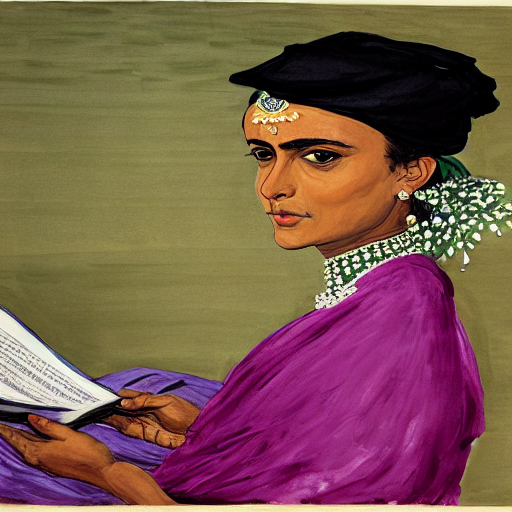

In [ ]:
# A prompt with the new embedding 

torch.manual_seed(1000)
image = pipe("Woman reading in the style of <watercolor-portrait>").images[0]
image

### Dreambooth 

Its a kind of fine tunig that attempts to introduce new subjects by providing a few images of the new subject. 

This is similar to the Textual Inversion but the process is different.

Instead of creating a new token, we select an existing token in the vocabulary and fine tune the model for a few hundred steps to bring that token close to the original images we've provided. 

This is like the regular fine tuning process.

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("pcuenq/jh_dreambooth_1000" , torch_dtype = torch.float16)
pipe = pipe.to("cuda")



Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

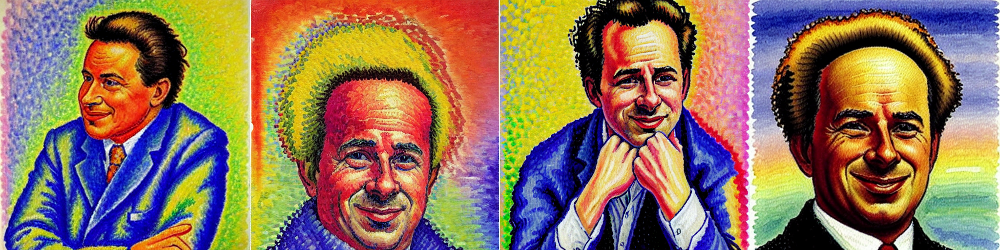

In [ ]:
torch.manual_seed(1000)

prompt = "Painting of sks person in the style of Paul Signac"
images = pipe(prompt, num_images_per_prompt=4).images
image_grid(images, 1, 4)